# Assignment B - The Harry Potter Universe

## 1) Motivation:

The dataset, that we wanted to analyse are all the seven books of the Harry Potter series, and the transcript for all eight movies. We are also gonna use the data from the fanbase wikipedia of Harry Potter ( http://harrypotter.wikia.com/wiki/Main_Page ).

We wanted to use the content of the book, as we think it could be interesting to see how the mood changes through each books. The transcript can be use to see which characters appear in which scene and see how often the same characters appear each time or together in the same scene. By using the fanbase wikipedia site, we can easily get information about everything from the Harry Potter universe, such as which characters belongs to which house, the characters relationships between each other and so much more.

For our goal, we wanted to show the user how the characters appeared in the movies, look at the relations between them and see which communities they belongs to. This could make the user be able to browse through the information and discover new relations or groups that may not have been obvious from the movies. We also wanted to view which word seems to be more important than other comparing through all the books and see if the words capture the essence of each books. We may think that some of the books are less “happy” than the others.




## 2) Basic stats:

**The Books**

We have all seven Harry Potter books merge together in one PDF file, and convert it to a text file, so we could easily work on it. Though Python, we split the file into seven pieces by manually checking and splitting, when a new book begins. 

**The Movie Transcripts**

By the transcripts, we converted them from a pdf-file to text-file, and divided each scene manuelt by writing “_START OF NEW SCENE_ “, so it will be easier to split up later. We later found out, that the transcript for the fifth movie we found, was not the transcript, used for this movie. We could still find the subtitles for the movie online, but it didn't show who was saying what. One of the group members volunteered to see the fifth Harry Potter movie and manually wrote down each character for lines, that appeared in the subtitles and split up the scenes.

From the start, we tried to split up the scenes by using regex, but because of the different structures of each script, it wouldn't work as we expected and got really complicated, so that's why we decided to manuelt split the scenes up by writing it in the transcript.

**The Wikia Fanbase**

We have a datafile that list all the characters names, where we can mapped both the first and last name to look up these characters, if only one of the names are used in the transcript. By the list of all the characters names, we then look up at the datadump from the wikia fanbase, and looking after the page, that match with the name of the character in our list. We then use the datafile to go through the list to make sure, the right names appear as we wanted to, because some characters are not in movies as in the books.   

Most of each wikia pages have a info-box, which contain alot of information like, the name, bloodstatus, school, etc. To get the information about the bloodstatus, we used regex, but run into alot of complication, as the value sometimes wasn't structured the same way, because the wikia site is written by different people. This meant that we have to make some manually adjustment and exceptions, so we could get the values that we wanted from each pages.

The datafile that list all the characters was used from this website: https://www.hp-lexicon.org/characters/

How we created all of this, is in a python notebook file, that can been found on the git: (**LINK**)


**For the database dump of the Harry Potter fandom wikia page, we have:**

- 15,728 pages
- 273 MB of data
- 5.086.137 lines of XML

**The books and movie transcripts:**
- 7 Books - 22,8 MB 
- 8 Movie scripts - 4,8 MB




## 3) Tools, theory and analysis

The books are opened, and as they lie in one huge file, the file is split into each book. A list is produced using the split() function to separate the books further into chapters and the Regular Expressions module to find all dialog(), aka. any string between “ ”, the regex used to isolate these sting is r'\“([\s\S]*?)\”'. 

The module Natural Language ToolKit ( NLTK) was used to import a list of english stopwords, to which the word “said” was added as we had observed that it was said so often that it sometimes interfered in some of our tests. A function tolist() was made to clean unicode issue that may be encountered when working with the text. 	The function sentiment() takes a list of tokens and calculates the sentiment using the happiness average values given in the course. All this, alongside tokenizing functions using NLTK, was used to calculate the sentiment of the books, the dialog from each chapter and each chapter as a whole. The TF-IDF and word cloud generators from previous assignments in the course was used to create word clouds for each book. In the end the sentiment was also calculated for each scene in the movie to see how it changes.


**Regular Expressions** have been essential as it became quite apparent that dialog seemed to illustrate the “mood” of the text better than the whole text. We believe this might be due to all the descriptive sections in books.

**NLTK** was used throughout the whole text analysis for its ease in processing text and build-in functions.


For the movie networks the main goal was to map out the characters that appear in each movie including their relationships. A challenge of creating networks from text is to divide text into appropriately sized chunks that capture the true social structure. 
In our case the scripts were already divided into scenes which contain the characters in their natural environments, capturing their social structure.
In addition to mapping out the relationships between the characters one goal was also to find the most relevant characters for each movie.
Finally we also wanted to use community detection to determine in the cliques that were captured through the movie network also align with some of the known cliques from the Harry Potter universe.

As the scripts varied in structure, it was quite difficult to determine which character spoke in each scene, which ones were only mentioned by the talking characters and the ones that were only mentioned in stage directions. For that reason an undirected network was used where edges were added between all characters that were mentioned in some form during a scene.
In order to determine the importance of characters, the node degree was used. 
It was also used to scale the size of the node to illustrate the importance.
One drawback of this method can be seen in some minor characters that only are mentioned in only one scene, but one that contains a lot of important characters. In order to combat that, the number of scenes a characters appears in was also factored in.
The betweenness centrality and eigenvector centrality could also have been used to measure the importance of the nodes, but were thoroughly analyzed because of time issues.
The resulting graphs seem to capture the know structures rather well as known families with minor roles are somewhat isolated and far from the center while the major characters are in the center together with a noticeably higher degree than the minor characters.
The node degrees were also used to analyse the relevance of each character over time.
Which also showed that the major characters were consistently among the most connected nodes while some minor characters that were only relevant for one movie had a high degree in only that case.
The degree distribution was used illustrate how common the several node degrees were show that the main characters had a significantly higher degree that most minor characters.

Communities were detected using Louvain Community detection with mixed results. Some communities were nicely made up of known groups like the Dursley or the Wealsey, while some were looked rather random, but the movie contains fights between opposing parties, it’s not surprising that the separation of the known groups isn’t always very clear.
A heatmap was used to show the composition of each community in relation to the most important known communities like the Houses, Muggles, Order of the Phoenix / Dumbledore’s Army, and the Death Eaters.


## 3.1) Network Analysis

In [1]:
import re
import json
from nltk.tokenize import RegexpTokenizer, word_tokenize
import networkx as nx
import matplotlib.pyplot as plt
from collections import namedtuple, defaultdict, Counter
from __future__ import division
from math import log, ceil
from operator import itemgetter
from fa2 import ForceAtlas2 as FA2
import community
import numpy as np
import seaborn as sn
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk import FreqDist
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import io 
from scipy import stats
import unicodedata
from nltk.stem.porter import *
from nltk.draw.dispersion import dispersion_plot

In [2]:
gryffindor = "#CE0E00"
slytherin = "#009403"
hufflepuff = "#FFCA52"
ravenclaw = "#6596BF"
muggle = "#cccccc"
default = "#4e0333"
order= "#fa5b0b"
deatheater = "#002f01"

In [3]:
save_plots = False

In [4]:
movie_data = namedtuple('movie', 'scenes, occurrences')

In [5]:
word_tokenizer = RegexpTokenizer(r'(\w+[-|\']?\w*)')

In [6]:
def script_to_secnens_dict(file_name):
    script = open(file_name,"r").read().decode("utf-8")
    scenes = defaultdict(str)
    matches = regex.finditer(script)
    for match in matches:
        sceneId = match.group(1)
        dialog = match.group(2)
        scenes[sceneId] += dialog
    return scenes

In [7]:
def process_script(script, tokenizer, name_mappings, special_cases=[], ignore=[]):
    occurrences = defaultdict(set)
    #divide script into scenes ignore the title, introduction, revisions, etc. 
    scenes = script.split("_START OF NEW SCENE_")[1:]
    
    for index, scene in enumerate(scenes):
        text = scene.lower()
        tokens = tokenizer.tokenize(text)

        for key, name in special_cases.iteritems():
            if key in ignore:
                continue
            elif key in scene:
                occurrences[index].add(special_cases[key])

        for token in tokens:
            if token in ignore:
                continue
            elif name_mappings.has_key(token):
                occurrences[index].add(name_mappings[token][0])
    
    return movie_data(scenes=scenes, occurrences=occurrences)

In [8]:
def total_occurences(occurences, character):
    return sum(1 for characters in occurences.values() if character in characters)

In [9]:
def generate_movie_network(occurrences):
    network = nx.Graph()
    for scene, characters in occurrences.iteritems():
        for character in characters:
            network.add_node(character)
            for other in characters:
                if character != other:
                    if network.has_edge(character, other): # if the edge already exists
                        network[character][other]['weight'] += 1 # increase the edge weight
                    else:
                        network.add_edge(character, other, weight=1) # if edge does not exists, make it
    return network

In [10]:
def display_network(G, pos, size_map=300, color_map = "red", save=False, file_name="image", node_lables=None):
    plt.figure(figsize=(20,20))
    plt.axis("off")
    nx.draw_networkx(
        G, 
        pos = pos,
        alpha=0.65, 
        labels = node_lables,
        with_labels=True, 
        edge_color="black", 
        node_size=size_map, 
        node_color=color_map,
        font_color="black",
        font_weight="bold"
    ) 
    if save:
        print "saving"
        plt.tight_layout()
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True, bbox_inches = "tight")

In [11]:
def generate_node_color(character, info_dict):
    try:
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        if house == "gryffindor":
            return gryffindor
        elif house == "slytherin":
             return slytherin
        elif house == "hufflepuff":
             return hufflepuff
        elif house == "ravenclaw":
             return ravenclaw
        elif blood == "muggle":
            return muggle
        else:
            return default
    except:
        return "#00DFF7"
    
    

In [12]:
def debug_characters_in_scenes(movie, sceneId):
    print movie.occurrences[sceneId], movie.scenes[sceneId]

In [13]:
def debug_scenes_by_character(movie, name):
    for scene, character in movie.occurrences.iteritems():
        if  name in character:
            print movie.scenes[scene]

In [14]:
def save_as_json(data, file_name):
    with open("../movieScripts/processed/" + file_name + ".json", 'w') as f:
        f.write(json.dumps(data))

In [15]:
files = [
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt",
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt",
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt",
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt",
    "HP5.txt",
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt",
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt",
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt" 
]

In [16]:
with open('nameDict.json') as json_file:  
    name_dict = json.load(json_file, encoding="utf-8")

In [17]:
with open('characterInfoDict.json') as json_file:  
    info_dict = json.load(json_file, encoding="utf-8")

In [18]:
ignore_in_movie={
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt": {"bertie", "jack", "po", "nicholas"},
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt": {"fluffy", "tufty", "gryffindor"},
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt": {"miranda", "ernie", "horace"},
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt": {"monsieur"},
    "(5)_Harry_Potter_and_the_Order_of_the_Phoenix.txt": {"gideon"},
    "HP5.txt":{"oswald", "bob"},
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt": {"WOOD", "felix"},
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt": {"percival", "elizabeth", "WOOD"},
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt": {"WOOD", "fang"}
}

In [19]:
special_cases = {
    "WOOD":"oliver wood", 
    "OLIVER WOOD": u"oliver wood", 
    "oliver wood": u"oliver wood",
    "Oliver wood": u"oliver wood",
    "mrs. weasley": u"molly weasley", 
    "mr. weasley": u"arthur weasley",
    "arthur weasley's daughter": u"ginny weasley",
    "ERNIE PRANG": u"ernie prang",
    "wailing widow": u"wailing widow",
    "Miss Brown": u"lavender brown",
    "MRS BLACK": u"walburga black",
    "BARTY JR": u"barty crouch jr.",
    "BARTY SR": u"barty crouch",
    "Frank Longbottom": u"frank longbottom",
    "HUGO": u"hugo granger-weasley",
    "ALBUS_SON": u"albus severus potter",
    "LILY_DAUGTER": u"lily l. potter",
    "ROSE_DAUGHTER": u"rose granger-weasley",
    "JAMES_SON": u"james potter ii",
    "ADRIAN": u"adrian (photographer)",
    "SIR_NICHOLAS": u"sir nicholas",
    "Gideon": u"gideon prewett",
    "LUCIOUS MALFOY": u"lucius malfoy",
    "Bob_muggle":"bob"
}

In [20]:
movies = []

# go through all scripts and process them
for script_name in files:
    with open("../movieScripts/" + script_name) as f:
        script = f.read()
        ignore = []
        if ignore_in_movie.has_key(script_name):
            ignore = ignore_in_movie[script_name]
        
        data = process_script(
            script=script, 
            tokenizer=word_tokenizer, 
            name_mappings=name_dict, 
            special_cases=special_cases, 
            ignore=ignore
        )
        movies.append(data)

In [21]:
with open("shortNames.json", "r") as json_dict:
    shortNames = json.load(json_dict)

100%|██████████████████████████████████| 10000/10000 [00:05<00:00, 1771.17it/s]


('BarnesHut Approximation', ' took ', '1.14', ' seconds')
('Repulsion forces', ' took ', '3.45', ' seconds')
('Gravitational forces', ' took ', '0.10', ' seconds')
('Attraction forces', ' took ', '0.14', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.23', ' seconds')


100%|██████████████████████████████████| 10000/10000 [00:07<00:00, 1348.25it/s]


('BarnesHut Approximation', ' took ', '1.17', ' seconds')
('Repulsion forces', ' took ', '4.93', ' seconds')
('Gravitational forces', ' took ', '0.05', ' seconds')
('Attraction forces', ' took ', '0.17', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.33', ' seconds')


100%|██████████████████████████████████| 10000/10000 [00:05<00:00, 1675.60it/s]


('BarnesHut Approximation', ' took ', '1.16', ' seconds')
('Repulsion forces', ' took ', '3.70', ' seconds')
('Gravitational forces', ' took ', '0.07', ' seconds')
('Attraction forces', ' took ', '0.17', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.26', ' seconds')


100%|██████████████████████████████████| 10000/10000 [00:04<00:00, 2380.39it/s]


('BarnesHut Approximation', ' took ', '0.80', ' seconds')
('Repulsion forces', ' took ', '2.46', ' seconds')
('Gravitational forces', ' took ', '0.05', ' seconds')
('Attraction forces', ' took ', '0.10', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.25', ' seconds')


100%|██████████████████████████████████| 10000/10000 [00:06<00:00, 1606.17it/s]


('BarnesHut Approximation', ' took ', '1.26', ' seconds')
('Repulsion forces', ' took ', '3.93', ' seconds')
('Gravitational forces', ' took ', '0.07', ' seconds')
('Attraction forces', ' took ', '0.13', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.22', ' seconds')


100%|██████████████████████████████████| 10000/10000 [00:07<00:00, 1360.36it/s]


('BarnesHut Approximation', ' took ', '1.24', ' seconds')
('Repulsion forces', ' took ', '4.82', ' seconds')
('Gravitational forces', ' took ', '0.09', ' seconds')
('Attraction forces', ' took ', '0.12', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.33', ' seconds')


100%|███████████████████████████████████| 10000/10000 [00:11<00:00, 888.49it/s]


('BarnesHut Approximation', ' took ', '2.01', ' seconds')
('Repulsion forces', ' took ', '7.36', ' seconds')
('Gravitational forces', ' took ', '0.11', ' seconds')
('Attraction forces', ' took ', '0.22', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.46', ' seconds')


100%|██████████████████████████████████| 10000/10000 [00:08<00:00, 1113.09it/s]


('BarnesHut Approximation', ' took ', '1.59', ' seconds')
('Repulsion forces', ' took ', '5.79', ' seconds')
('Gravitational forces', ' took ', '0.08', ' seconds')
('Attraction forces', ' took ', '0.26', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.38', ' seconds')


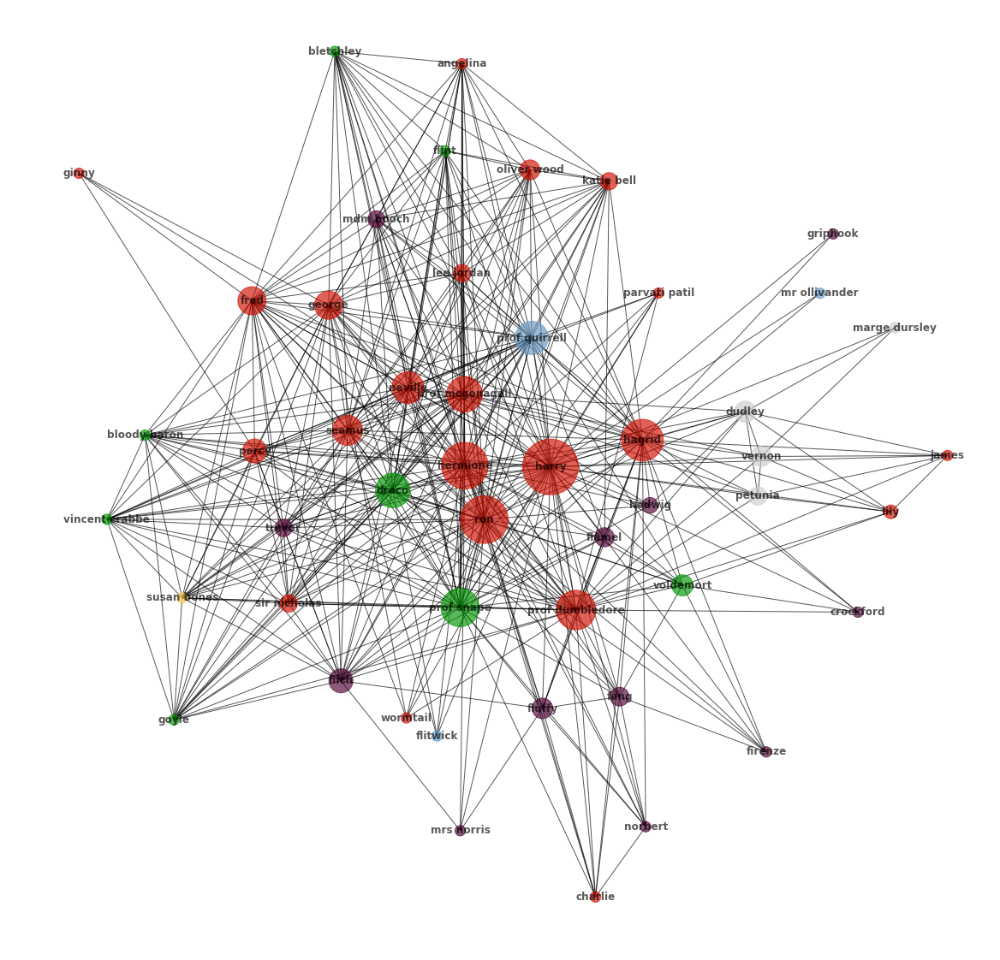

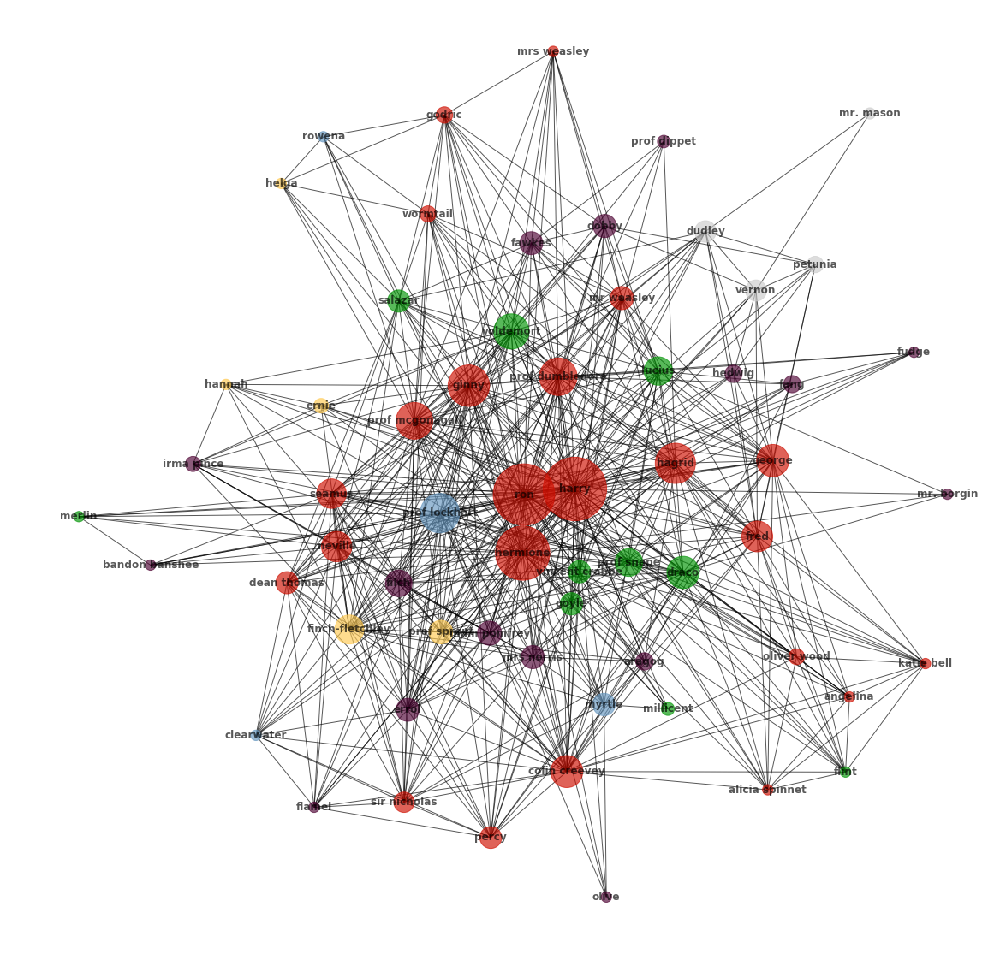

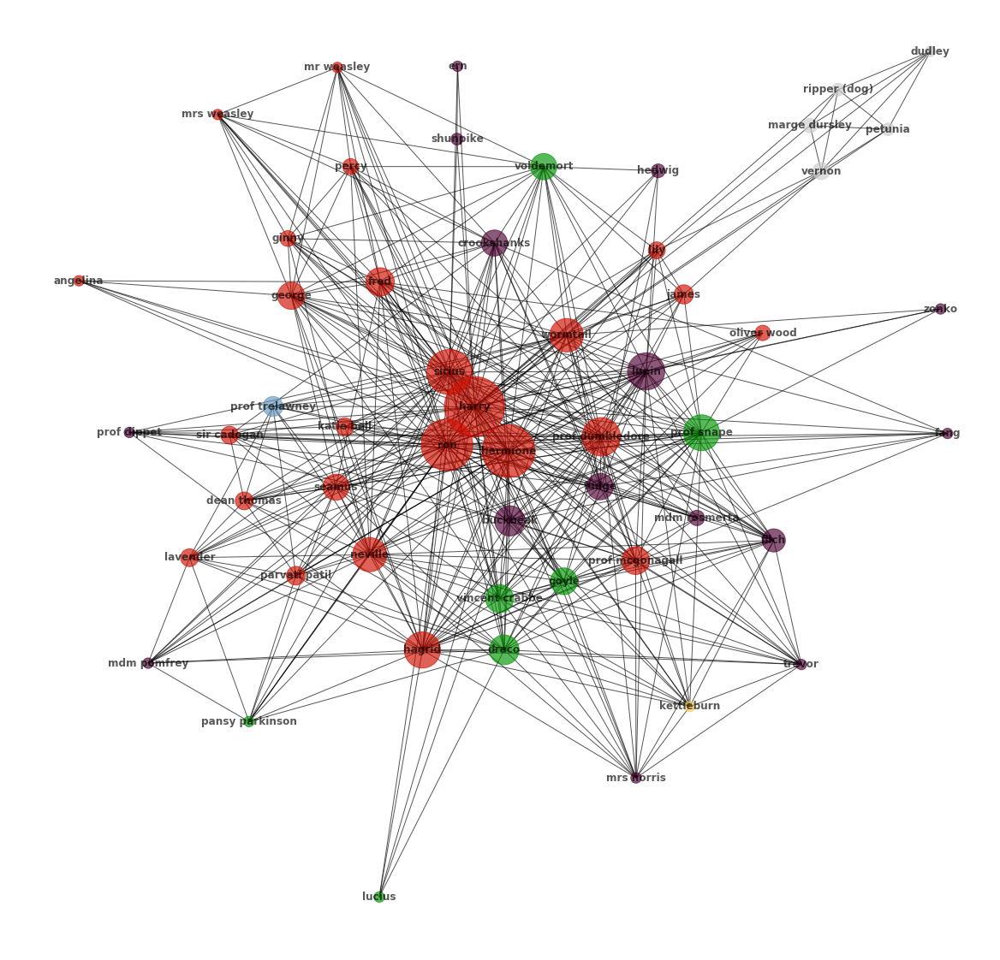

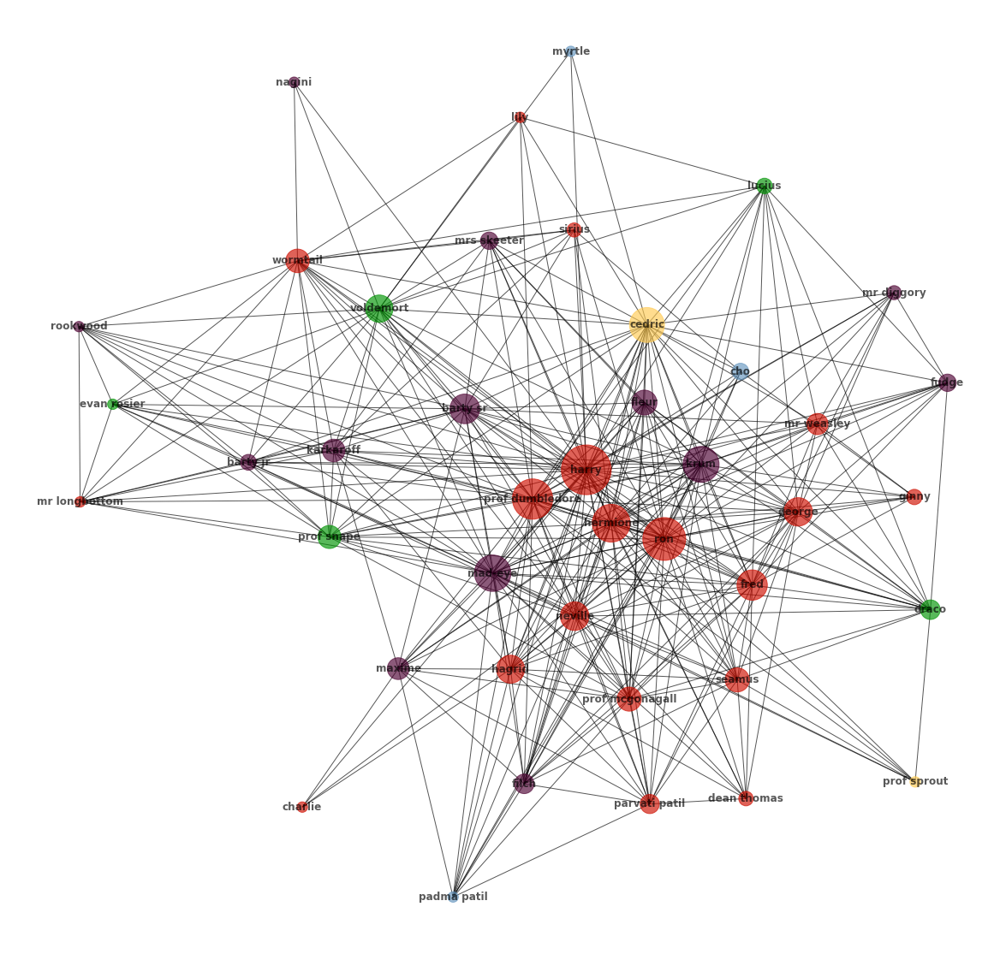

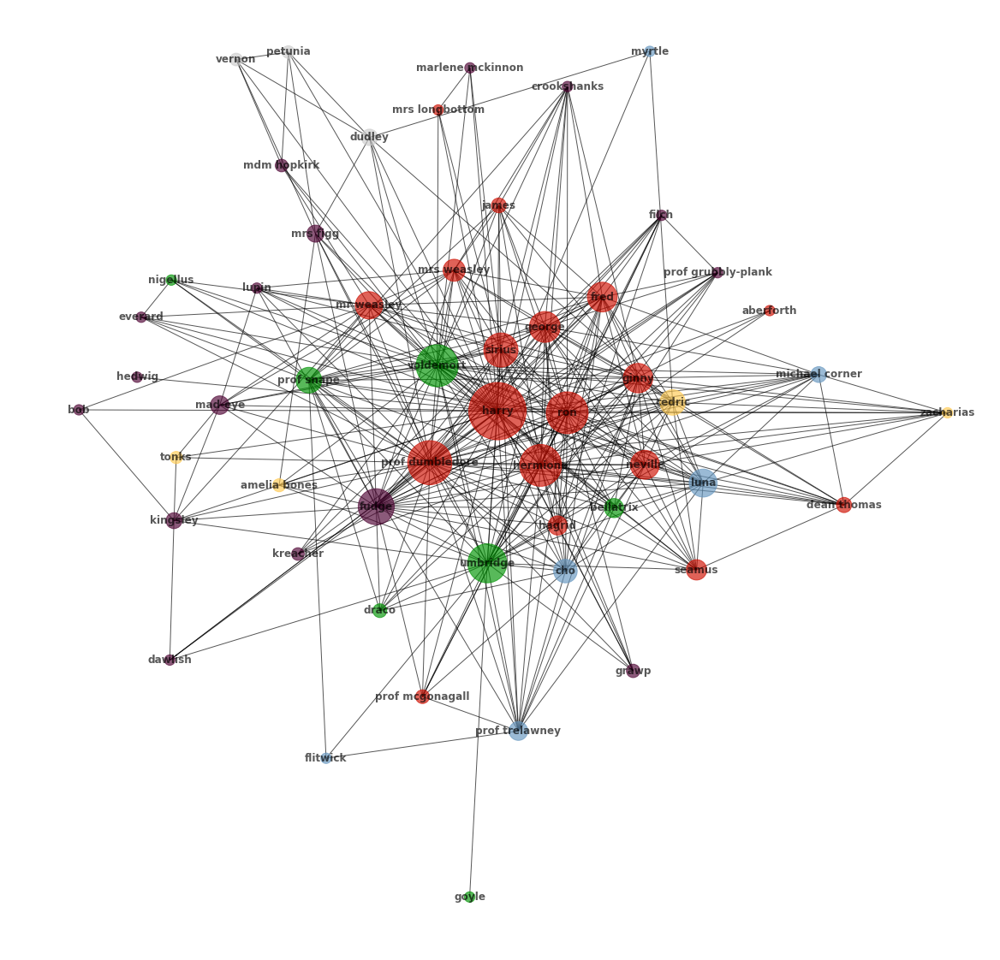

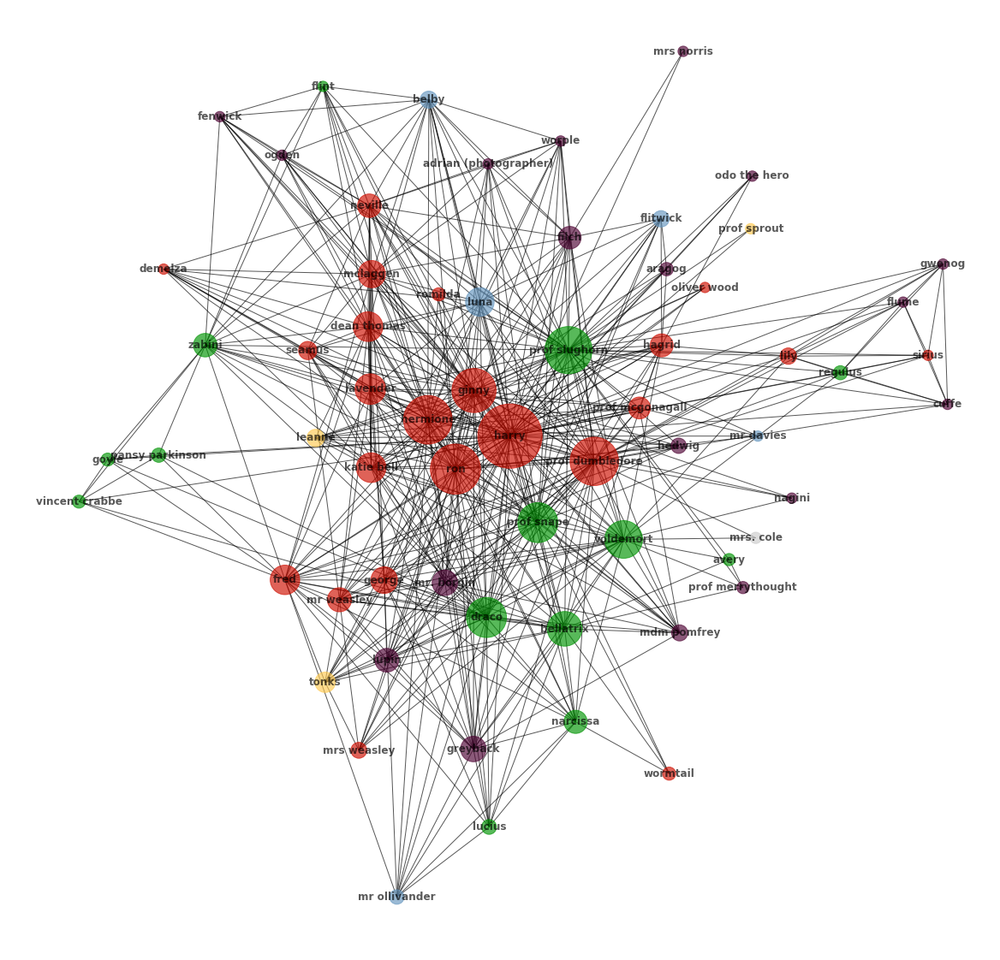

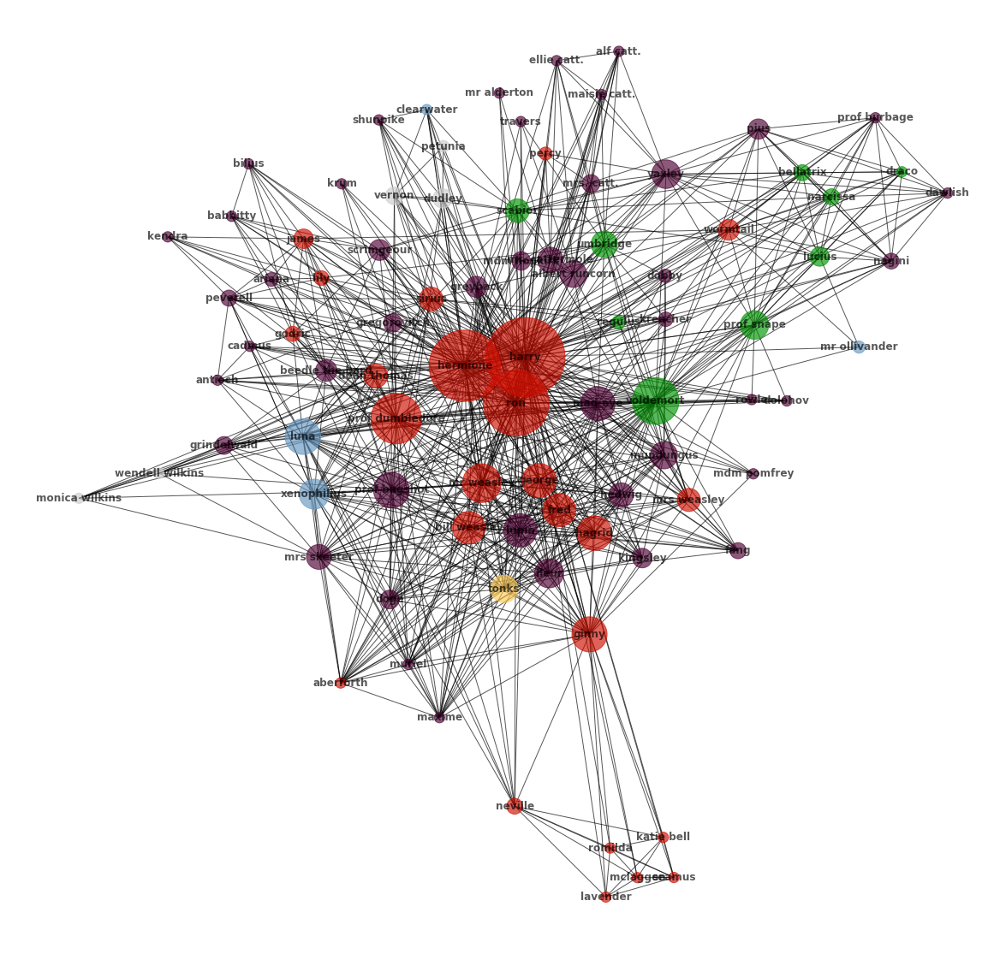

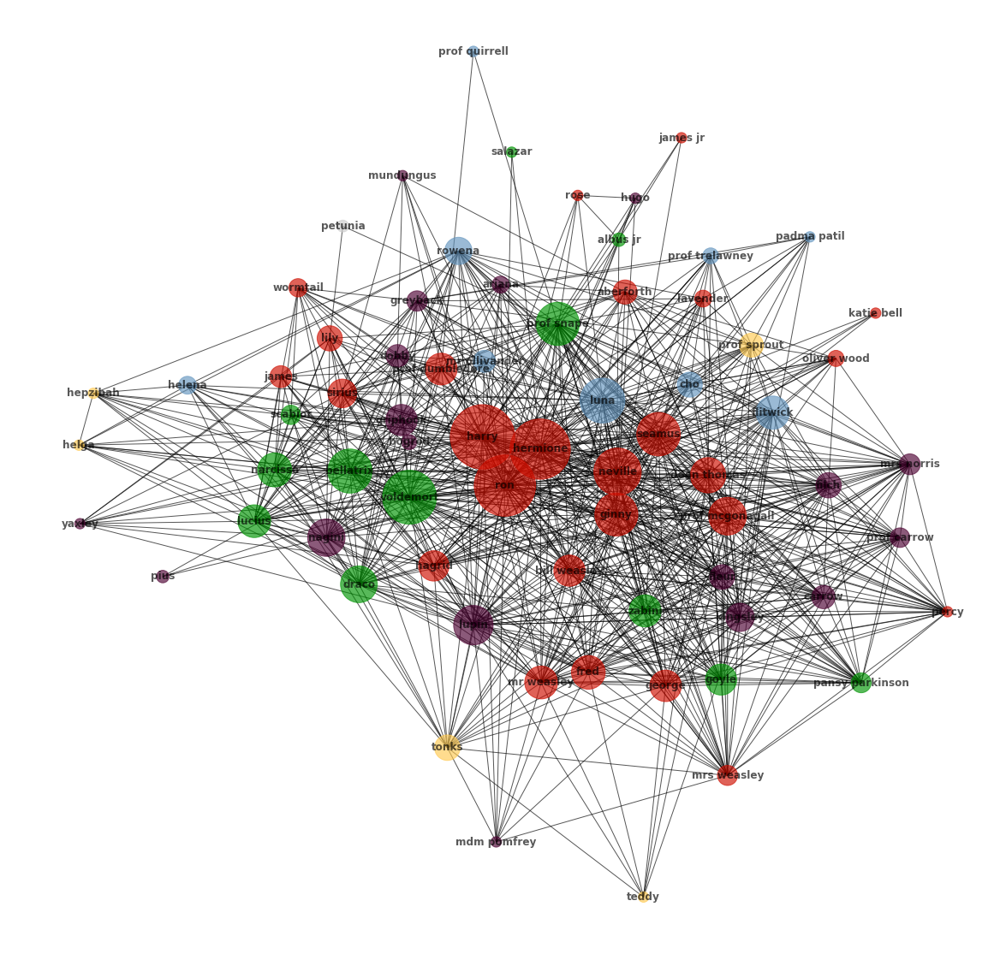

In [22]:
networks = []
positions = []

forceatlas2 = FA2(scalingRatio=100, gravity=100)

for index , movie in enumerate(movies):
    G = generate_movie_network(movie.occurrences) 
    position = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=10000)
    short_labels = {n:shortNames[n] for n in G.nodes}
    node_size = [150 + int(20 * G.degree(n) * log(total_occurences(movie.occurrences, n))) for n in G.nodes]
    color_map = [generate_node_color(n, info_dict) for n in G.nodes]
    display_network(G, position, node_size, color_map, save=save_plots, file_name="movie"+str(index+1), node_lables=short_labels)
    networks.append(G)
    positions.append(position)

Disadvantages of adding a note to each character taht is mentioned in a scene: the chatacter might only appear in one scene but could get an infalted degree if many other characters are mentioend in the scnene.

In [23]:
def plot_networks_over_time(nodes, edges, lables, save=False, file_name="plot"):
    fig = plt.figure()

    x = range(len(labels))
    y1 = nodes
    y2 = edges

    fig, ax1 = plt.subplots()
    #plt.ylim(30,140)

    color = gryffindor
    ax1.spines['top'].set_visible(False)
    ax1.tick_params(axis='y', labelcolor="black", color="black")
    ax1.tick_params(axis='x', colors='black')
    ax1.yaxis.label.set_color('black')
    ax1.xaxis.label.set_color('black')
    ax1.spines['bottom'].set_color('black')
    ax1.spines['left'].set_color('black')
    ax1.spines['top'].set_color('black')
    ax1.spines['right'].set_color('black')
    ax1.set_ylabel('nodes', color=color)
    ax1.plot(x, y1, color=color)

    plt.xticks(x, labels,rotation=90)
    
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = ravenclaw
    ax2.spines['top'].set_visible(False)
    ax2.spines['bottom'].set_color('black')
    ax2.spines['left'].set_color('black')
    ax2.spines['top'].set_color('black')
    ax2.spines['right'].set_color('black')
    ax2.set_ylabel('edges', color=color)  # we already handled the x-label with ax1
    ax2.plot(x, y2, color=color)
    ax2.tick_params(axis='y', labelcolor="black", color="black")

    plt.xticks(rotation=90)

    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    if save:
        plt.savefig("../plots/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    plt.show()
    

<Figure size 432x288 with 0 Axes>

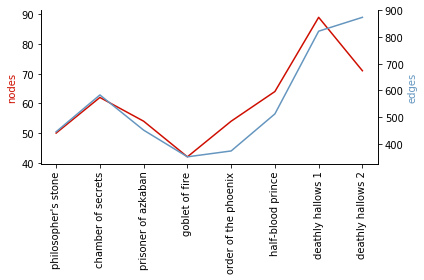

In [24]:
nodes = []
edges = []

for index, network in enumerate(networks):
    nodes.append(len(network.nodes))
    edges.append(len(network.edges))
    
labels = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"
]

plot_networks_over_time(nodes, edges, labels, save=save_plots, file_name="degreeSeries")

In [25]:
with open("../characters.json") as f:
    characters = json.load(f) 

In [26]:
"Nicolas Flamel" in characters

True

In [27]:
degrees_by_movie = defaultdict(list)

for index, network in enumerate(networks):
    top_degrees = sorted(nx.degree(network), key=itemgetter(1), reverse=True)[:20]
    for node, degree in top_degrees:
        degrees_by_movie[node].append((index, degree))

In [28]:
labels = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"
]

In [29]:
def display_degree_series(x, y, title, color, labels, save=False, file_name="image"):
    fig = plt.figure()#(figsize=(8,20))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors='black')
    axis.tick_params(axis='y', colors='black')
    axis.yaxis.label.set_color('black')
    axis.xaxis.label.set_color('black')
    axis.title.set_color("black") 
    axis.spines['bottom'].set_color('black')
    axis.spines['left'].set_color('black')
    plt.plot(x,y, marker="o", color=color)
    plt.title(title)
    plt.xlim(-1,len(labels))
    plt.ylim(0,max(y)+10)
    plt.xticks(range(len(labels)), labels, rotation=90)
    plt.ylabel("degree")
    plt.tight_layout()
    if save:
        plt.savefig("../plots/degrees/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")
    plt.show()

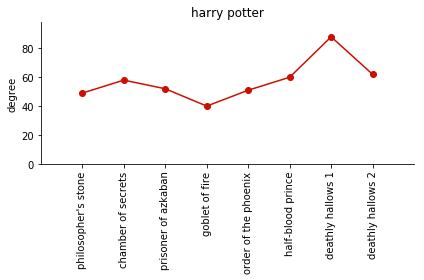

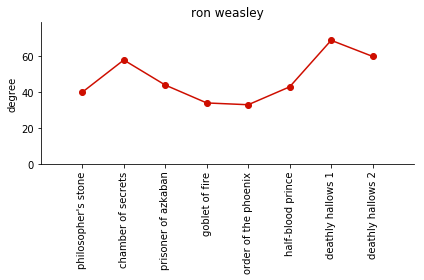

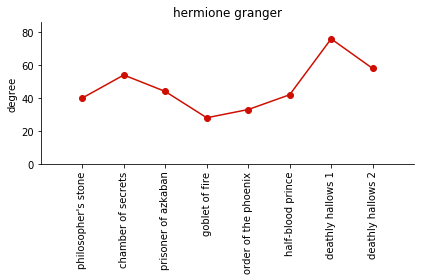

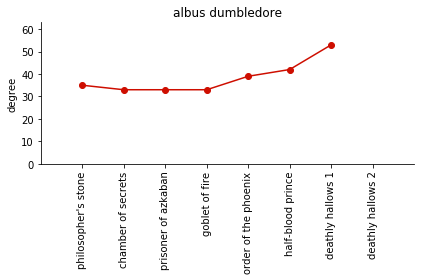

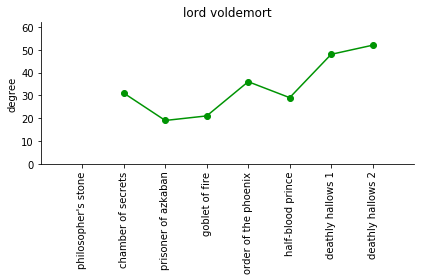

...

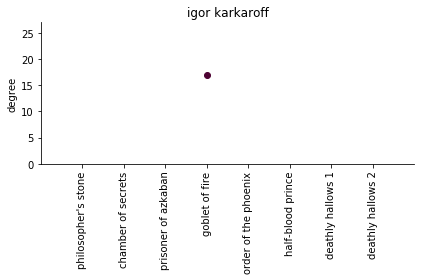

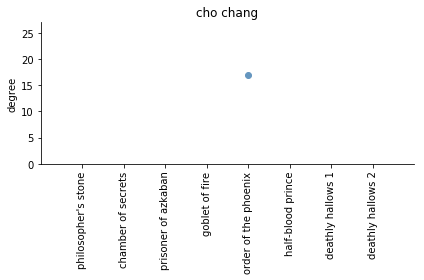

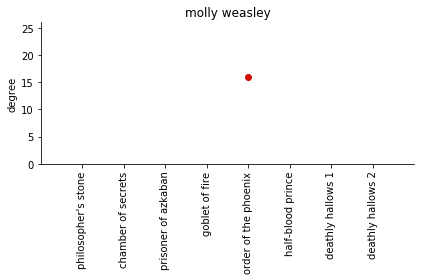

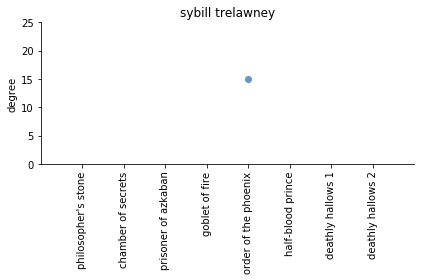

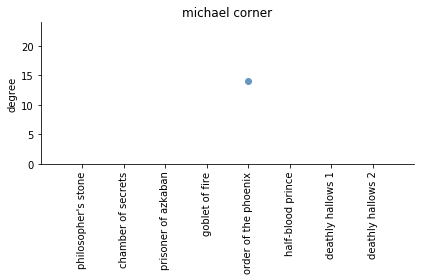

In [30]:
sorted_by_most_total_degrees = sorted(degrees_by_movie.iteritems(), key=lambda kv: sum(zip(*kv[1])[1]), reverse=True)
for index, (node, degrees) in enumerate(sorted_by_most_total_degrees):
    x,y = zip(*degrees)
    color = generate_node_color(node, info_dict)
    name = "degree" + str(index+1)
    display_degree_series(x, y, node, color, labels, save=save_plots, file_name=name)

In [31]:
json_dict_name = "shortNames.json"

with open(json_dict_name, "r") as json_dict:
    shortNames = json.load(json_dict)
    for network in networks:
        for node in network.nodes:
            if not shortNames.has_key(node):
                print "adding:", node
                shortNames[node] = node

with open(json_dict_name, "w") as json_dict:
    json.dump(shortNames, json_dict)

In [32]:
for i, movie in enumerate(movies):
    print "movie:", str(i+1)
    debug_scenes_by_character(movie, "bob ogden")

movie: 1
movie: 2
movie: 3
movie: 4
movie: 5
movie: 6
movie: 7
movie: 8


In [33]:
#missing_infos = []
for movie in movies:
    for scene, characters in movie.occurrences.iteritems():
        for character in characters:
            if not info_dict.has_key(character):
                print character
                #missing_infos.append(character)            

In [34]:
#missing_infos = []
for movie in movies:
    for scene, characters in movie.occurrences.iteritems():
        for character in characters:
            if "nearly-headless nick" in character:
                    print character

In [35]:
"""missing_info_dict = {}
for character in set(missing_infos):
    missing_info_dict[character] = {"house":"", "blood":"", "loyaty":[]}"""

'missing_info_dict = {}\nfor character in set(missing_infos):\n    missing_info_dict[character] = {"house":"", "blood":"", "loyaty":[]}'

In [36]:
"""with open("missingInfoDict.json", "w") as json_file:
    json.dump(missing_info_dict, json_file)"""

'with open("missingInfoDict.json", "w") as json_file:\n    json.dump(missing_info_dict, json_file)'

adding: amelia susan bones
adding: bob ogden
adding: oswald beamish
adding: wilhelmina grubbly-plank

In [37]:
def generate_colors(partitions):
    color_map = {}
    colors = ["#1676B6", "#FF7F00", "#24A121", "#D8241F", "#FFFF99", "#BDAED4"]
    for partition in partitions:
        color_map[partition] = colors[partition]
    return color_map

In [38]:
def analyze_communities(partitions, info_dict):
    matrix = [[0 for x in range(len(set(partitions.values())))] for y in range(9)]
        
    for character, community_id in partitions.iteritems():
        house = info_dict[character]["house"]
        blood = info_dict[character]["blood"]
        loyalty = info_dict[character]["loyalty"]
        
        matrix[0][community_id] = sum([1 for c in partitions.itervalues() if c == community_id])
        if house == "gryffindor":
            matrix[1][community_id] +=1
        if house == "slytherin":
            matrix[2][community_id] +=1
        if house == "hufflepuff":
            matrix[3][community_id] +=1
        if house == "ravenclaw":
            matrix[4][community_id] +=1
        if blood == "muggle":
            matrix[5][community_id] +=1
        if "death eaters" in loyalty or "lord voldemort" in loyalty:
            matrix[6][community_id] +=1
        if "order of the phoenix" in loyalty:
            matrix[7][community_id] +=1
        if "dumbledore's army" in loyalty:
            matrix[8][community_id] +=1
            
    return matrix   

In [39]:
def display_community_heatmap(matrix, save=False, file_name="heatmap", color_map="PuBu"):
    df_cm = pd.DataFrame(matrix, index = [i for i in ["total size", "gryffindor",  "slytherin", "hufflepuff", "ravenclaw", "muggle", "death eater", "order of the phoenix", "dumbledore's army"]],
                  columns = [i for i in range(len(set(partitions.values())))])
    plt.figure()#figsize = (30,2))
    plt.tight_layout()
    axis = sn.heatmap(df_cm, annot=True, cmap=color_map, annot_kws={"rotation":0},cbar=True, fmt="d")
    cbar = axis.collections[0].colorbar
    cbar.ax.yaxis.set_tick_params(color="black")
    cbar.ax.tick_params(axis='y', colors='black')
    cbar.set_label("Characters/Category", color="black")
    axis.set_xlabel("Community Id")
    axis.tick_params(axis='x', colors='black')
    axis.tick_params(axis='y', colors='black')
    axis.yaxis.label.set_color('black')
    #cbar.yaxis.label.set_color('white')
    axis.xaxis.label.set_color('black')
    axis.title.set_color("black") 
    if save:
        plt.savefig("../plots/networks/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")
    plt.show()

In [40]:
def display_degree_destribution(degrees, save=False, file_name="degreeDist"):
    degree_sequence = sorted([d for n, d in degrees], reverse=True)
    degreeCount = Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())

    fig = plt.figure(1)
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors='black')
    axis.tick_params(axis='y', colors='black')
    axis.yaxis.label.set_color('black')
    axis.xaxis.label.set_color('black')
    axis.title.set_color("black") 
    axis.spines['bottom'].set_color('black')
    axis.spines['left'].set_color('black')
    plt.bar(deg, cnt, width=0.80, color=ravenclaw)
    plt.xlabel('degree')
    plt.ylabel('number of nodes')
    plt.tight_layout()
    if save:
        plt.savefig("../plots/distributions/" + file_name + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    fig = plt.figure(2)
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors='black', which='both')
    axis.tick_params(axis='y', colors='black', which='both')
    axis.yaxis.label.set_color('black')
    axis.xaxis.label.set_color('black')
    axis.title.set_color("black") 
    axis.spines['bottom'].set_color('black')
    axis.spines['left'].set_color('black')
    plt.loglog(deg, cnt, marker ="o", lw=0, color=ravenclaw)
    plt.xlabel('degree')
    plt.ylabel('number of nodes')
    plt.tight_layout()
    if save:
        plt.savefig("../plots/distributions/" + file_name + "LogLog" + ".png", format="PNG", transparent=True,  bbox_inches = "tight")

    plt.show()


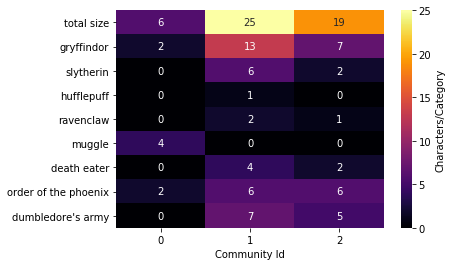

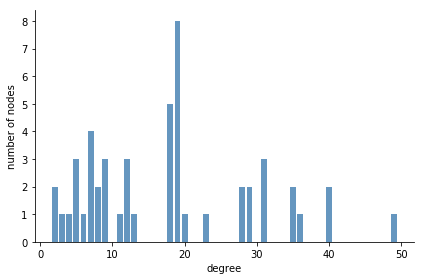

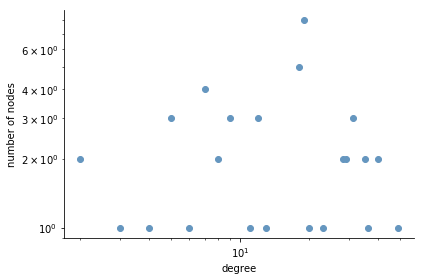

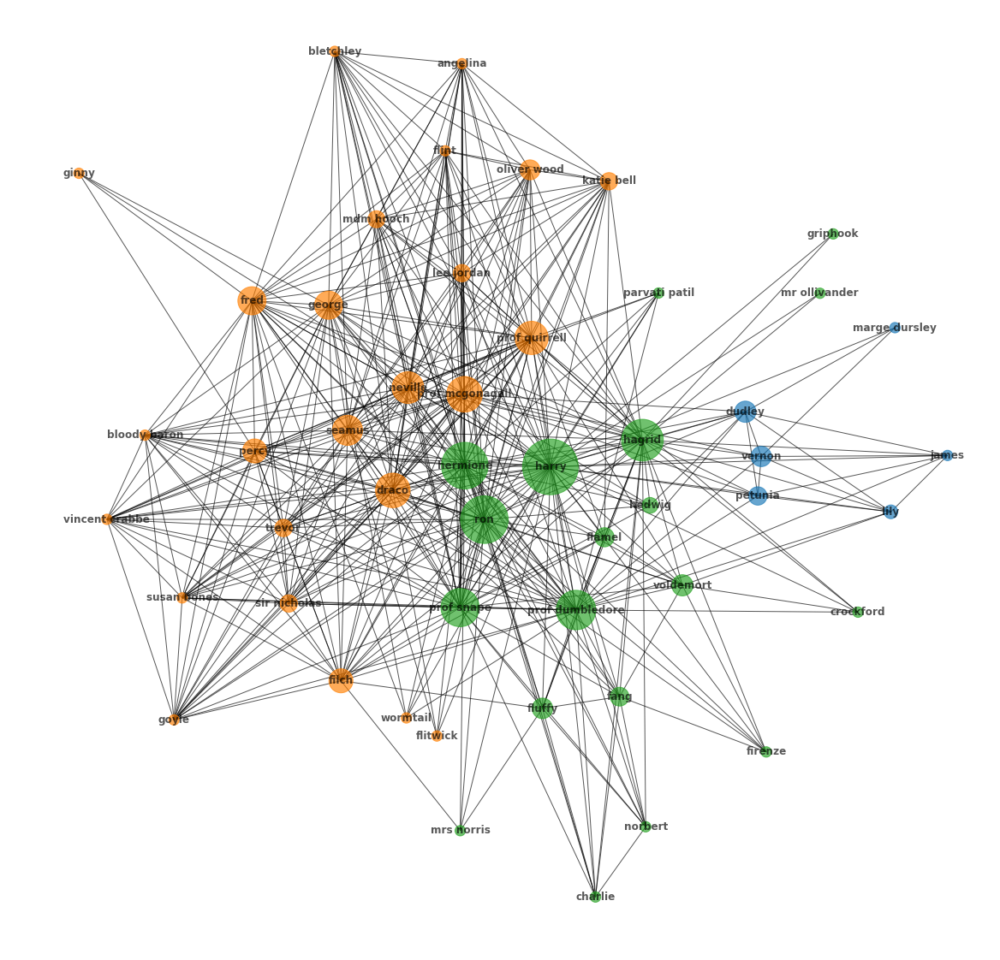

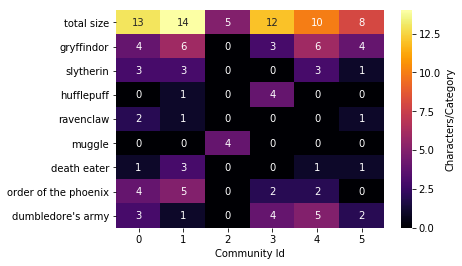

...

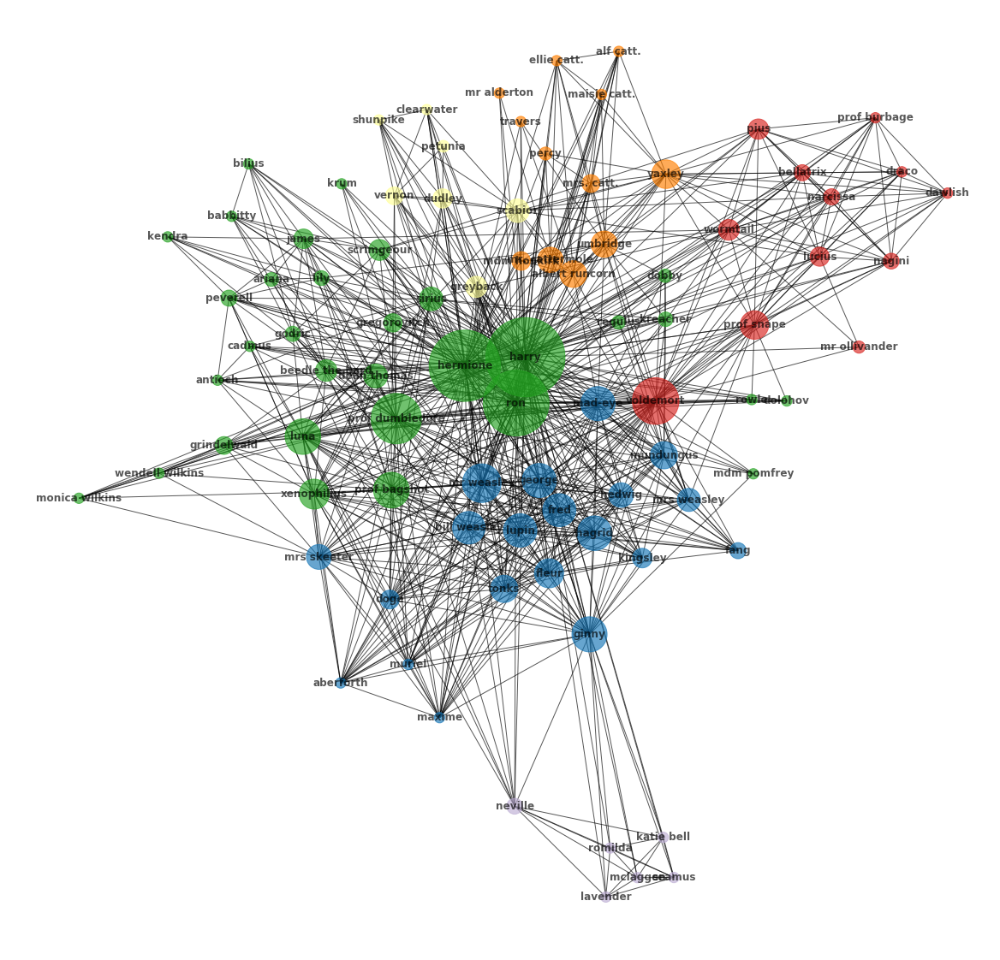

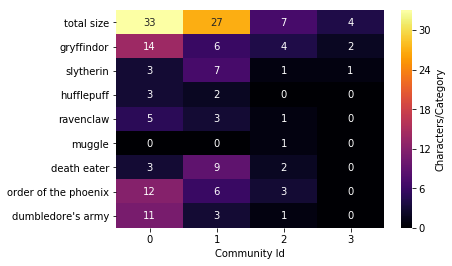

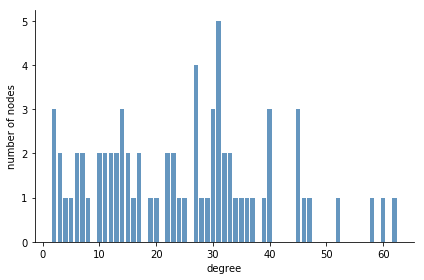

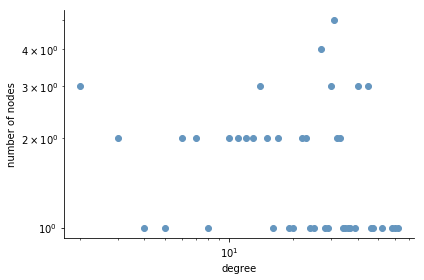

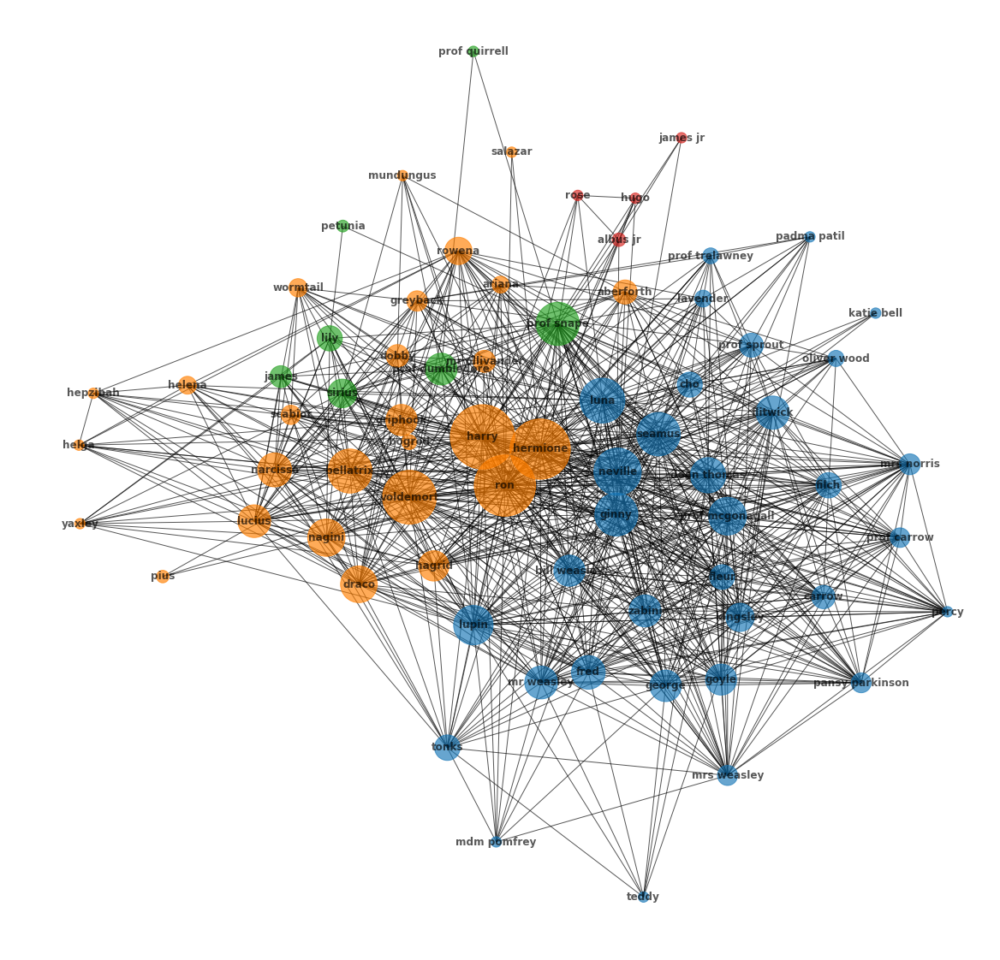

In [41]:
for index, (G, position, movie) in enumerate(zip(networks, positions, movies)):
    file_suffix = "Movie"+ str(index+1)
    partitions = community.best_partition(G,weight='weight')
    unique_partitions = set(partitions.values())
    
    partition_colors = generate_colors(unique_partitions)
    short_labels = {n:shortNames[n] for n in G.nodes}
    node_size = [150 + int(20 * G.degree(n) * log(total_occurences(movie.occurrences, n))) for n in G.nodes]
    color_map = [partition_colors[partitions[n]] for n in G.nodes]
    
    matrix = analyze_communities(partitions, info_dict)
    
    heatmap_name = "heatmap" + file_suffix
    display_community_heatmap(matrix, color_map="inferno", save=save_plots, file_name=heatmap_name)
    
    distribution_name = "distr" + file_suffix 
    display_degree_destribution(G.degree(), save=save_plots, file_name=distribution_name)
    
    network_name = "communities" + file_suffix
    display_network(
        G, 
        position, 
        node_size, 
        color_map, 
        save=save_plots, 
        file_name=network_name, 
        node_lables=short_labels)
    
   

In [42]:
max(zip(*G.degree())[1])

62

In [43]:
b,h,l = info_dict["harry potter"].values()

In [44]:
l

[u'potter family',
 u'weasley family',
 u'albus dumbledore',
 u"dumbledore's army",
 u'order of the phoenix',
 u'hogwarts',
 u'gryffindor',
 u'gryffindor quidditch team',
 u'slug club',
 u'british ministry of magic',
 u'auror department',
 u'department of magical law enforcement',
 u'society for the promotion of elfish welfare',
 u'holyhead harpies']

In [45]:
"order of the phoenix" in l

True

## 3.2) TF-IDF and Sentiments Analysis

In [46]:
#open a text file of all the books in the book series
raw = io.open('../books/HP_all.txt', "r", encoding="utf-8").read()
#Extract any additional information on the books from the beginning and end of the file.
#books = raw[944:6317630]

In [47]:
#Isolate each book individually, from the first chapter to the last fullstop.
book1 = raw[944:441162]
book2 = raw[442547:936710]
book3 = raw[938248:1567329]
book4 = raw[1569412:2678784]
book5 = raw[2680953:4180604]
book6 = raw[4182370:5170313]
book7 = raw[5173433:6317630]

In [48]:
#Collect all the books into an arrey to more simply navigate and extract information.
book = []
book.append(book1)
book.append(book2)
book.append(book3)
book.append(book4)
book.append(book5)
book.append(book6)
book.append(book7)
print(len(book))

7


In [49]:
#Create a list of lists with the individual chapters, split at the unique word CHAPTERS.
chp = []
for bok in book:
    chp.append(bok.split("CHAPTER")[1:])
print(len(chp))

7


In [50]:
#the stopwords for later use  in the wordcloud
stop_words = set(stopwords.words('english'))
#including "said" as it is appeard repeatedly on th wordclouds.
stop_words.add(u'said')
#print(stop_words)
#print(type(stopwords.words('english')))

In [51]:
#Function to extract only the dialog from a text, while also making sure to accound for utf-8
def dialog(book):
    book = book.encode("utf-8")
    book = book.replace('\xe2\x80\x99','\'')
    book = book.replace('\xe2\x80\x94','-')
    book = book.replace('\xe2\x80\x98','\'')
    book = book.replace("\n\n\xe2\x80\x9c", ' ')
    dialogen = re.findall(r'\“([\s\S]*?)\”', book)
    return dialogen

In [52]:
#Cleanign text, with respect to utf-8
def tolist(book):
    book = book.encode("utf-8")
    book = book.replace('\xe2\x80\x99','\'')
    book = book.replace('\xe2\x80\x94','-')
    book = book.replace('\xe2\x80\x98','\'')
    book = book.replace("\n\n\xe2\x80\x9c", ' ')
    book = book.replace("\u2019","\'")
    book = book.replace('\n',' ')
    out = book
    return out

In [53]:
#Extracting the average happyness index to be used for sentiment analysis
from collections import defaultdict
ds = pd.read_csv('../Data_Set_S1.txt', skiprows=3, sep=" ", delimiter="\t")
ds.word[ds.word == 'after'].index[0]

avg_word_happiness = defaultdict(float)
for index, data in ds.iterrows():
    word =  data["word"]
    score = data["happiness_average"]
    avg_word_happiness[word] = score

In [54]:
#function to calculate sentiment on a list of tokens
def sentiment(toke):
    tokens = [x.lower() for x in toke]
    unique_tokens = list(set(tokens))
    sum = 0
    remove = 0
    for token in unique_tokens:
        if avg_word_happiness.has_key(token):
            h = avg_word_happiness[token]
            f = tokens.count(token)
            sum += (h*f)
        else:
            remove += tokens.count(token)
    if (len(tokens)-remove) == 0:
        sent = 0
    else:
        sent= sum/(len(tokens)-remove)
    return sent

In [55]:
#creating a list of lists of the the dialogs on each book.
dilog = []
for bok in book:
    dilog.append(dialog(bok))
print(len(dilog))

7


In [56]:
#tokenizes an list input
def tokenize_list(text):
    tokenizer = RegexpTokenizer(r'\w+')
    dialog = []
    for i in range(len(text)):
        line = tokenizer.tokenize(text[i])
        dialog.append(line)
    return dialog

#tokenizes a string input
def tokenize_str(text):
    tokenizer = RegexpTokenizer(r'\w+')
    line = tokenizer.tokenize(text)
    return line

In [57]:
#function to evaluate the sentiment analysis of the dialog
def sentiment_dilog(dialog):
    g = tokenize_list(dialog)
    sent = []
    for i in range(len(g)):
        sen = sentiment(g[i])
        sent.append(sen)
    return sent

In [58]:
#Find the sentimen for each of the books based on dialog. i belive this is the most efficient as dialog better reflects
#a mood than the desciptive parts of a book.
sendilog = []
for boook in dilog:
    sendilog.append(sentiment_dilog(boook))
for senti in sendilog:
    print(np.mean(senti))

5.308377204471506
5.295769655712531
5.286883953145128
5.267052585703176
5.272197023995928
5.2909159492604605
5.20978714308175


In [103]:
#dilog[0]

In [60]:
#Sentimant analysis of each book
senbook = []
for each in book:
    senbook.append(sentiment(tokenize_str(each)))
    print(sentiment(tokenize_str(each)))

5.33385911817
5.32007207254
5.31981087567
5.33023696409
5.32624551042
5.3280163771
5.29587962731


In [61]:
#function to extract stopwords from a string
def stopwords(book):
    unique = set(book)
    bo = book
    for word in unique:
        if word in stop_words:
            bo.remove(word)
    return bo

In [62]:
#remove stopwwords and tokenize the books
nostop = []
for each in book:
    nostop.append(stopwords(tokenize_str(each)))

In [63]:
#function to calculate the TF-IDF, tanken from prior assignment in the course
def TF_IDF(documents):
    result = []
    cross_document_freq = defaultdict(int)
    #count in how many documents the token occurs
    for document in documents:
        for token in set(document):
            cross_document_freq[token] += 1 
    
    for document in documents:
        TF = FreqDist(document)
        # calculate the TF/IDF for each token
        TF_IDF = defaultdict(float) 
        for token in TF.keys():
            TF_IDF[token] = TF[token] * log(len(documents)/cross_document_freq[token])
            
        result.append(sorted(TF_IDF.iteritems(), key=lambda (k,v): (v,k), reverse=True))
    return result

In [64]:
#For the world could illustration, taken form earlier exercise in the course
def generate_cloud_string(freq_list):
    result = ""
    for token, frequency in freq_list:
        result += (token + " ") * int(ceil(frequency))
    return result  

In [65]:
#Function to display the wordcloud, taken from earlier assignment in the course.
def display_cloud(string, background="black",mask=None, collocations=False, stop_words={}, title="wc" ):
    cloud = WordCloud(
        background_color=background,
        width=1800,
        height=1400,
        mask = mask,
        stopwords=stop_words,
        collocations=collocations
    ).generate(string)
    plt.figure(figsize=(20,20))
    plt.imshow(cloud)
    plt.axis('off')
    #plt.savefig("../plots/clouds/" + title + ".png", dpi=300)
    #itle(title)
    plt.show()

In [66]:
WC = TF_IDF([nostop[0],nostop[1],nostop[2],nostop[3],nostop[4],nostop[5],nostop[6]])

In [67]:
CL = []
for i in WC:
    CL.append(generate_cloud_string(i))

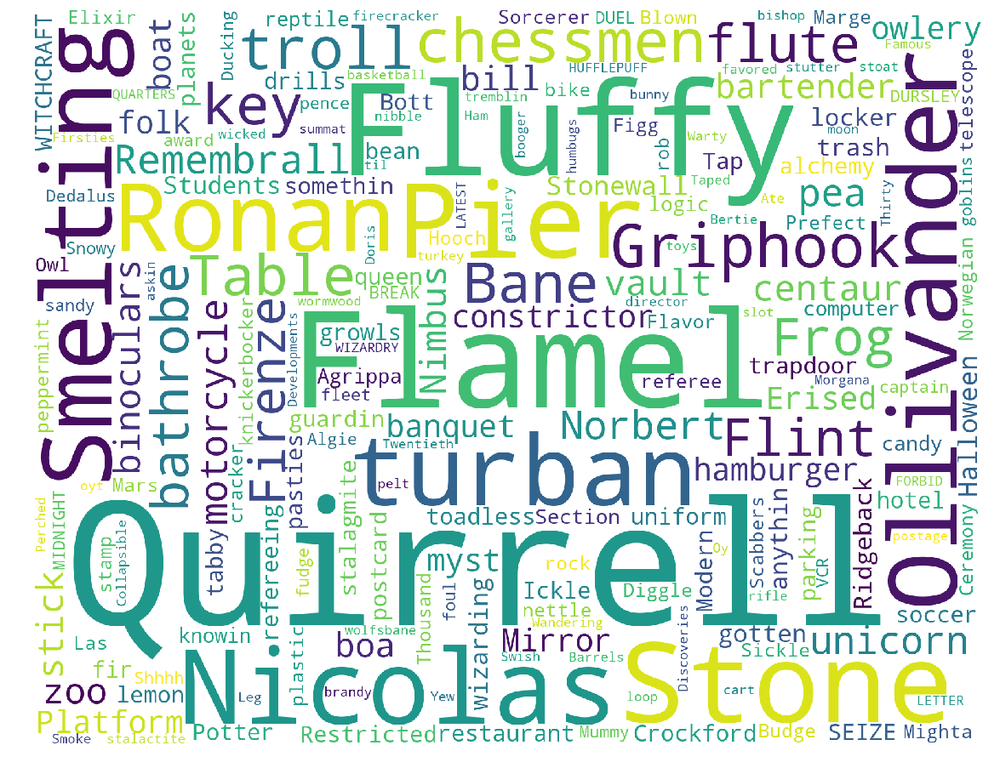

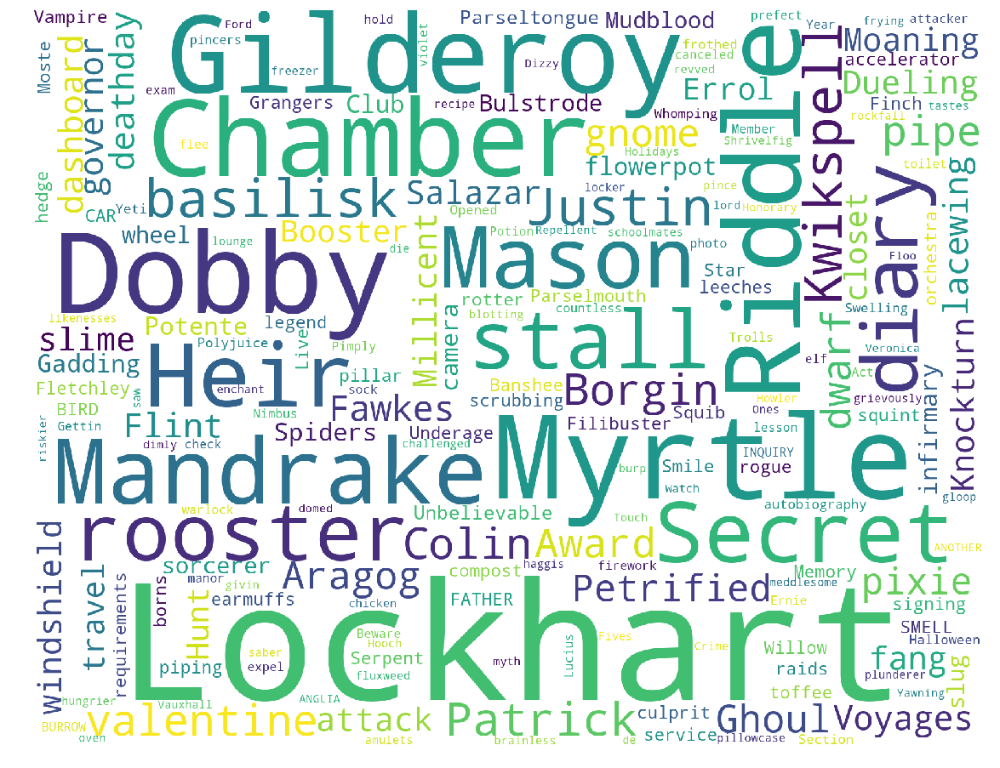

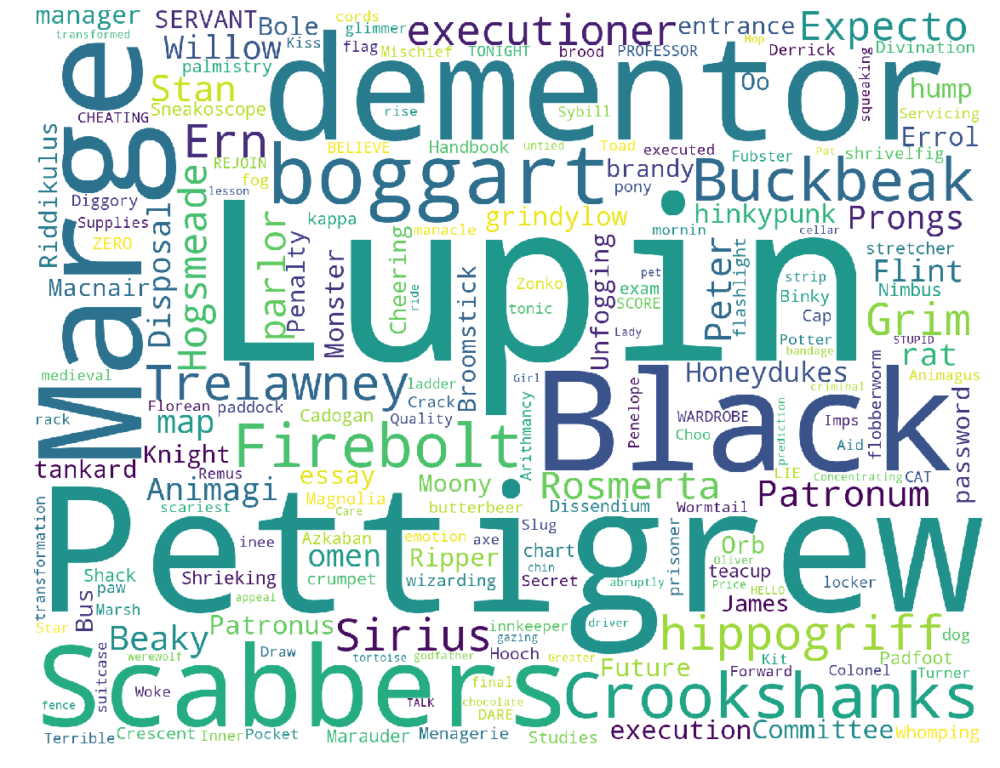

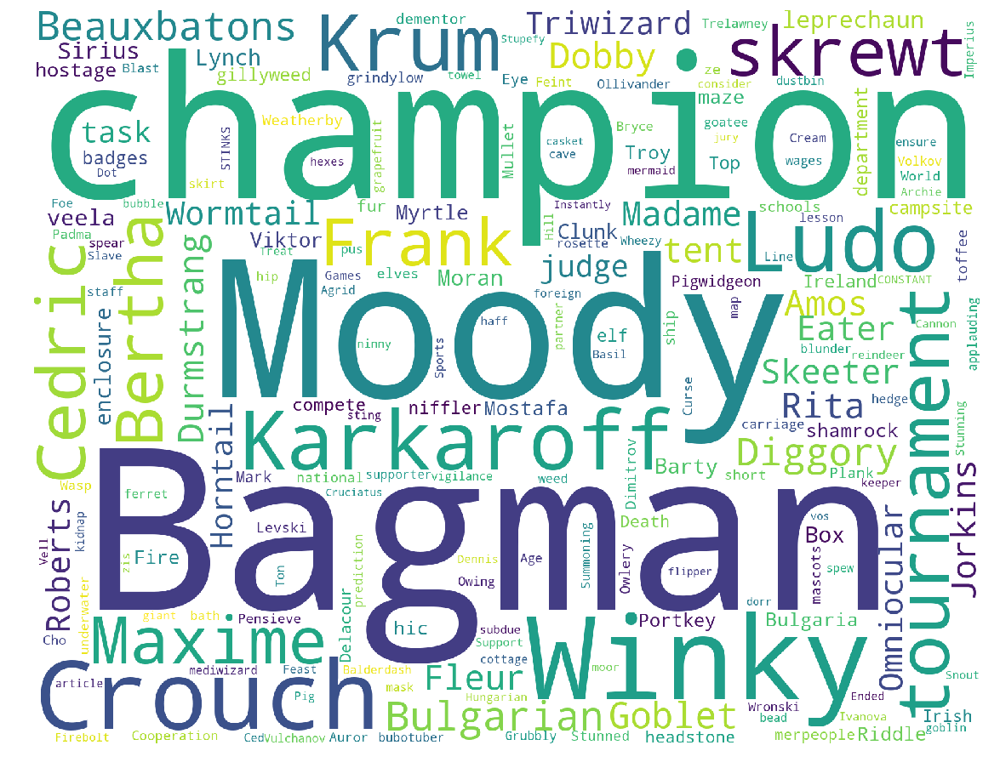

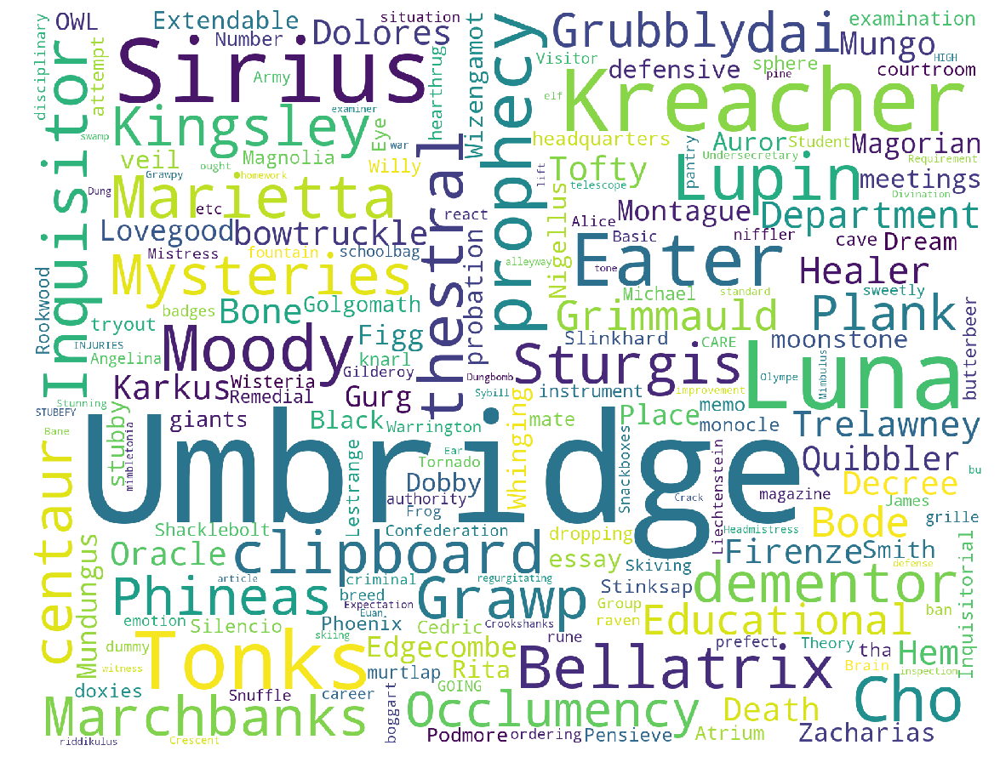

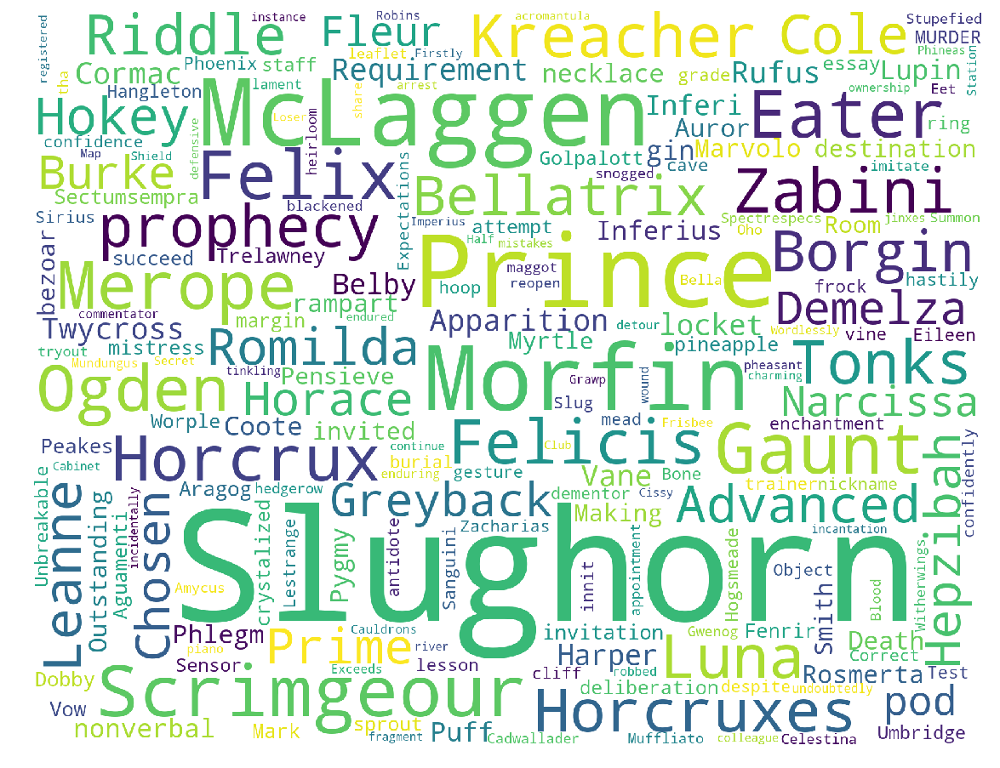

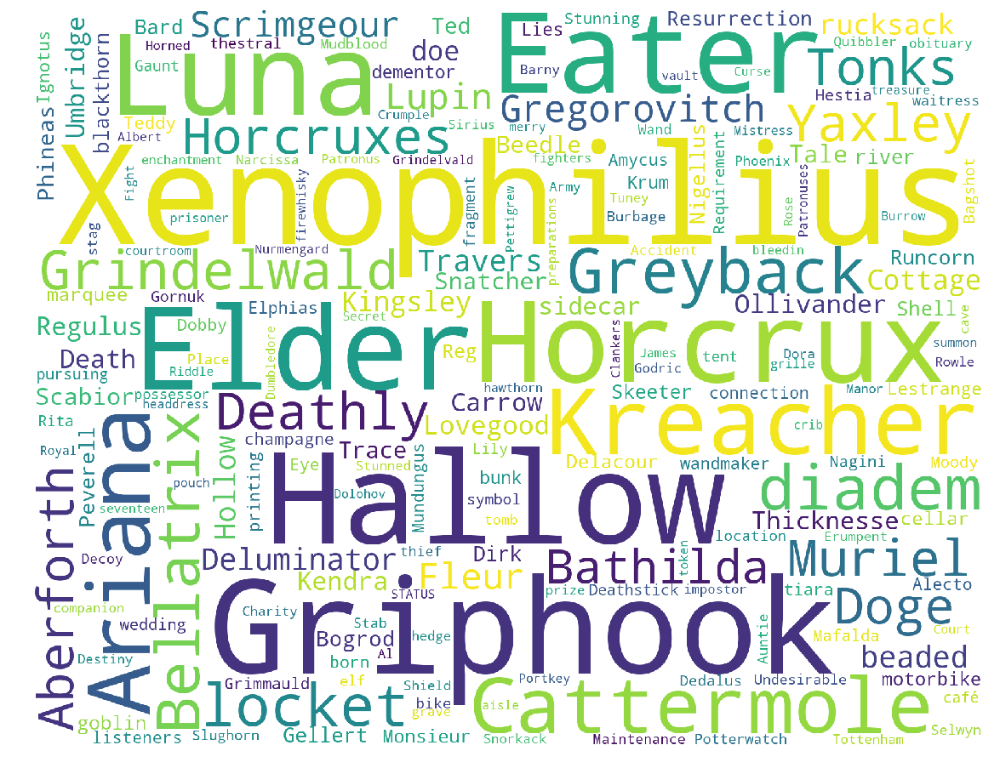

In [68]:
white = "#ffffff"
for index, j in enumerate(CL):
    display_cloud(j, white, stop_words=stop_words, title="book"+str(index+1))

In [69]:
#sentiment for dialog in the chapters chapters
def sentchap(chpX):
    senchp = []
    for chap in chpX:
        senchp.append(sentiment_dilog(dialog(chap)))
    return senchp

In [70]:
def remove_values_from_list(the_list, val):
    while val in the_list:
        the_list.remove(val)

In [71]:
def avesentchp(senchpX):
    senchp = []
    for i in senchpX:
        remove_values_from_list(i,0)
        senchp.append(np.mean(i))
    return senchp

In [72]:
#Sent of chapter according to dialog.
avesent = []
for books in chp:
    avesent.append(avesentchp(sentchap(books)))

C:\Users\Michs\Anaconda2\lib\site-packages\numpy\core\fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\Michs\Anaconda2\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [73]:
#sentiment of chapters
chapsent = []
for chap in chp:
    sentimen = []
    for each in chap:
        sentimen.append(sentiment(each))
    chapsent.append(sentimen)

In [98]:
def display_sentiment(x,y,labels, lable_locations, title="sent"):
    disp_color = "black"
    fig = plt.figure(figsize=(20,8))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, color=ravenclaw)
    for book in lable_locations:
        plt.axvline(x=book, color="black")
    plt.xticks(lable_locations, labels,rotation=90, color= disp_color)
    plt.ylabel("Average Sentiment", color=disp_color)
    plt.tight_layout()
    plt.savefig("../plots/" + title + ".png", format="PNG", transparent=True, bbox_inches="tight")

    plt.show

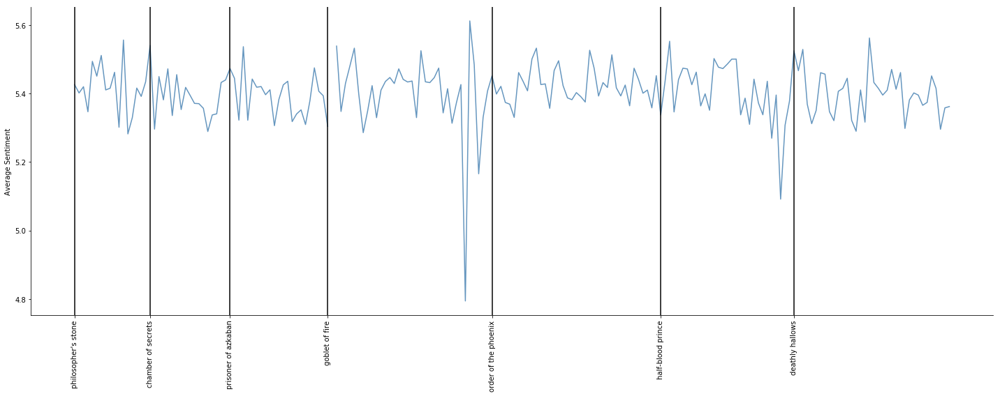

In [99]:
book_names = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows", 
]

y = []
book_start = []
for index, book_by_chapters  in enumerate(avesent):
    y += book_by_chapters
    if not book_start:
        book_start.append(0)
    else:
        book_start.append(book_start[index-1]+len(avesent[index-1]))
    
x_v = range(len(y))

display_sentiment(x_v,y,labels=book_names, lable_locations=book_start, title="sentChap")

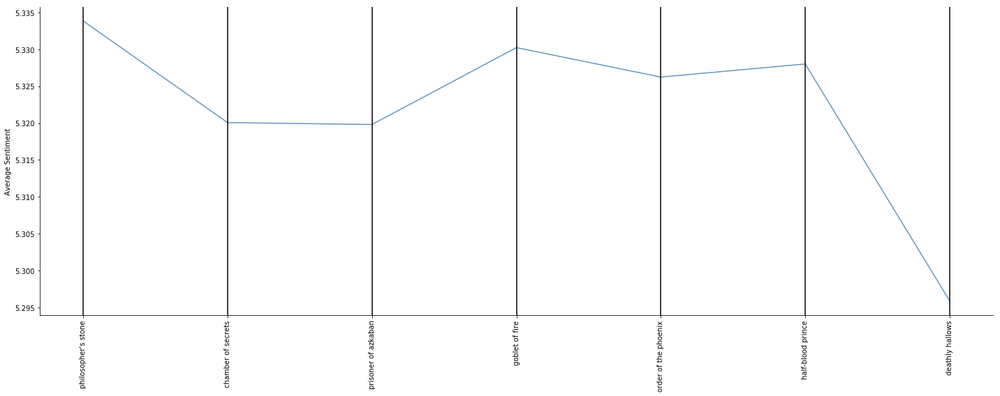

In [100]:
book_sentiments = [
    5.33385911817,
    5.32007207254,
    5.31981087567,
    5.33023696409,
    5.32624551042,
    5.3280163771,
    5.29587962731
]
x_2 = range(len(book_sentiments))
display_sentiment(x_2,book_sentiments, labels=book_names, lable_locations=x_2, title="sentBook")

In [77]:
book_sentiments

[5.33385911817,
 5.32007207254,
 5.31981087567,
 5.33023696409,
 5.32624551042,
 5.3280163771,
 5.29587962731]

In [78]:
for l in avesent:
    print(len(l))

17
18
22
37
38
30
36


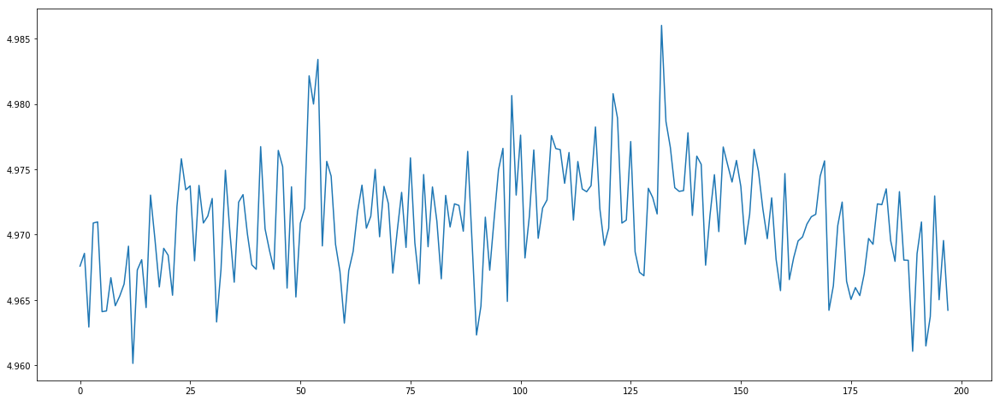

In [79]:
y = []
for book_by_chapters in chapsent:
    y += book_by_chapters
x = range(len(y))

fig = plt.figure(figsize=(20,8))
plt.plot(x,y)

In [80]:
text = nltk.Text(book[0]+book[1]+book[2]+book[3]+book[4]+book[5]+book[6])

In [81]:
from nltk.util import bigrams

In [82]:
def generate_collocations(tokens):
    '''
    Given list of tokens, return collocations.
    '''
    ignored_words = nltk.corpus.stopwords.words('english')
    bigram_measures = nltk.collocations.BigramAssocMeasures()

    # Best results with window_size, freq_filter of: (2,1) (2,2) (5,1)
    finder = nltk.collocations.BigramCollocationFinder.from_words(tokens, window_size = 2)
    finder.apply_word_filter(lambda w: len(w) < 3 or w.lower() in ignored_words)
    finder.apply_freq_filter(1)

    colls = finder.nbest(bigram_measures.likelihood_ratio, 100)

    return colls 

In [101]:
books = tokenize_list(book)
#books[6]

In [102]:
#generate_collocations(books[0])

In [85]:
files = [
    "(1)_Harry_Potter_and_the_Philosophers_Stone.txt",
    "(2)_Harry_Potter_and_the_Chamber_of_Secrets.txt",
    "(3)_Harry_Potter_and_the_Prisoner_of_Azkaban.txt",
    "(4)_Harry_Potter_and_the_Goblet_of_Fire.txt",
    "HP5.txt",
    "(6)_Harry_Potter_and_the_Half-Blood_Prince.txt",
    "(7)_Harry_Potter_and_the_Deathly_Hallows_Part_1.txt",
    "(8)_Harry_Potter_and_the_Deathly_Hallows_Part_2.txt" 
]

In [86]:
scenes = []
for script_name in files:
    with open("../movieScripts/" + script_name) as f:
        script = f.read()
        scenes.append(script.split("_START OF NEW SCENE_")[1:])

In [91]:
scenesent = []
for chap in scenes:
    sentim = []
    for each in chap:
        sentim.append(sentiment(each))
    scenesent.append(sentim)

In [96]:
def display_sentiment_scene(x,y,labels, lable_locations):
    disp_color = "black"
    fig = plt.figure(figsize=(20,8))
    axis = plt.gca()
    axis.spines['right'].set_visible(False)
    axis.spines['top'].set_visible(False)
    axis.tick_params(axis='x', colors=disp_color)
    axis.tick_params(axis='y', colors=disp_color)
    axis.yaxis.label.set_color(disp_color)
    axis.xaxis.label.set_color(disp_color)
    axis.title.set_color(disp_color) 
    axis.spines['bottom'].set_color(disp_color)
    axis.spines['left'].set_color(disp_color)
    plt.plot(x,y, color=ravenclaw)
    for book in lable_locations:
        plt.axvline(x=book, color=disp_color)
    plt.ylim(4.8,5.1)
    plt.xticks(lable_locations, labels,rotation=90, color= disp_color)
    plt.ylabel("Average Sentiment", color=disp_color)
    plt.tight_layout()
    plt.savefig("../plots/sentScenes.png", format="PNG", transparent=True, bbox_inches="tight")
    plt.show

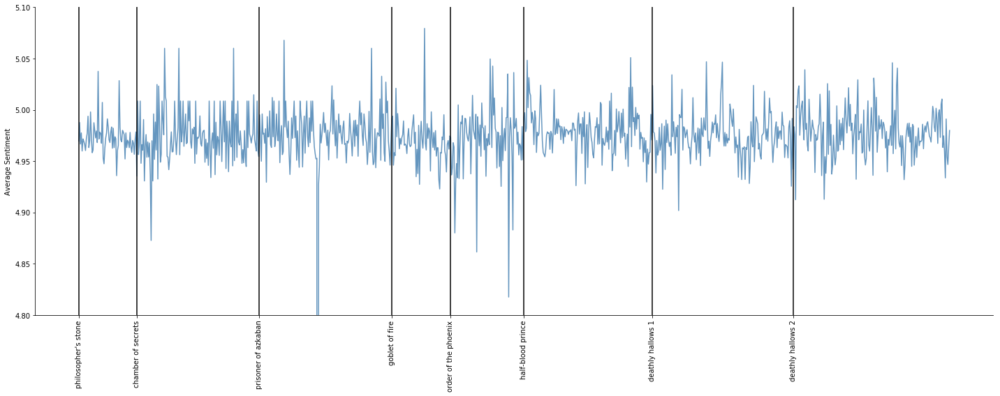

In [97]:
book_names = [
    "philosopher's stone", 
    "chamber of secrets", 
    "prisoner of azkaban", 
    "goblet of fire", 
    "order of the phoenix", 
    "half-blood prince", 
    "deathly hallows 1", 
    "deathly hallows 2"   
]
y = []
book_start = []
for index, book_by_chapters  in enumerate(scenesent):
    y += book_by_chapters
    if not book_start:
        book_start.append(0)
    else:
        book_start.append(book_start[index-1]+len(scenesent[index-1]))
    
x_v = range(len(y))

display_sentiment_scene(x_v,y,labels=book_names, lable_locations=book_start)

In [94]:
book_start

[0, 69, 214, 372, 442, 529, 682, 849]

In [95]:
for scene in scenes:
    print len(scene)

69
145
158
70
87
153
167
187


## Discussion

### What went well?

The website came out great and illustrate very well our different datas, so people can see and understand, what it is.
We manage to make a network dimension over time, where by showing a graph, could see how many characters appeared for each movie and their connection between each of them. A graph was made to show degree over time for each most important characters for each movies. Made movie network, that illustrate graphs, where the nodes are the characters and the edges is the connection between each character, if they have either appeared or mentioned in a scene together. We also detected which characters belongs to which houses, the muggles, other magical creatures and colored the nodes by that. We catched the different communities for each movie and showed the distribution of the knowing groups for each communities. By creating word clouds, we could show the most important and unique words for each book. And made a sentiment over the books, chapters, and scenes from the movies to show, what the overall mood of the Harry Potter Universe.



### What is still missing? What could be improved?, Why?

The initial idea for the networks  was to create both a network for the wiki page as well as networks for  the movies, but because of some issues....


Use the sentiment differently as we did here .... 


 
 

